# Pseudo Truth Fits
When a standard input-output test is performed, we typically have 2 outputs we're analyzing: the fit result, and the "truth" fit result which tells us the true generated parameters that the fit result should obtain. The typical way to get this truth information is by performing a mass-independent fit, except every bin's parameters are fixed to the truth value and only 1 free scaling parameter provides the ability for the overall intensity to be adjusted.

Ideally, given enough randomized fits, the fit result should be able to make its way to the true likelihood minimum. If ambiguities or issues in the randomization procedure exist though, this may not occur, and this is where the pseudo-truth fit comes in. The idea is very simple, to initialize the fit at the true parameters but allow them to float. There is no guarantee that the fit parameters should all remain untouched, as the overall intensity still needs to be adjusted for, and so the parameters could be tampered with during this adjustment process. 

* Fit Details
  * To mimic the cuts performed in data, a cut on the bachelor $\pi^0$ and proton mass is made ($M_{p\pi^0} > 1.4~GeV$) to remove any $\Delta^+$ contribution. We of course don't generate a $\Delta^+$ in the MC, but we want to match what we do in data
    * Further on a test is done comparing results to when the cut is *not* made

## Loading and Processing Data
Lets load in the data files needed and prepare the dataframes

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math
import seaborn as sns

from pathlib import Path    
import sys, os
parent_dir = str(Path().resolve().parents[3])
sys.path.insert(0, parent_dir)
import analysis.scripts.pwa_tools as pwa_tools

# change some plot parameters to look better
plt.rcParams["figure.figsize"] = (10, 8)
plt.rcParams["figure.dpi"] = 500 # TEMP: reduced for file size. Can increase for presentations
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["legend.fontsize"] = 16
plt.rcParams["xtick.major.width"] = 2.0
plt.rcParams["xtick.minor.width"] = 1.8
plt.rcParams["ytick.major.width"] = 2.0
plt.rcParams["ytick.minor.width"] = 1.8
plt.rcParams["lines.markersize"] = 10 # bumped down from normal due to large mass range

In [2]:
path = f"{parent_dir}/analysis/input-output-tests/0m_1m_1p/pseudo-truth"

df = pd.read_csv(f"{path}/pseudo-truth_ppi0-1.4.csv", index_col="index")
df.drop(2, inplace=True)
df.drop(36, inplace=True)
df.reset_index(drop=True, inplace=True)
df_data = pd.read_csv(f"{path}/../data.csv")

# The 1.04-1.06 and 1.72-1.74 bins refuse to converge, so drop them
df_data.drop(2, inplace=True)
df_data.drop(36, inplace=True)
df_data.reset_index(drop=True, inplace=True)

df_truth = pd.read_csv(f"{path}/../truth.csv", index_col="index")
df_truth.drop(2, inplace=True)
df_truth.drop(36, inplace=True)
df_truth.reset_index(drop=True, inplace=True)

MASS_BINS = df_data["mass_mean"]

bin_width = (df_data["mass_high_edge"] - df_data["mass_low_edge"])[0]

# create the plotter object
plotter = pwa_tools.Plotter(df, df_data, truth_df=df_truth)

## Analysis

### Standard Plots
Lets first take a look at the standard set of plots to see if the results agree with the truth info

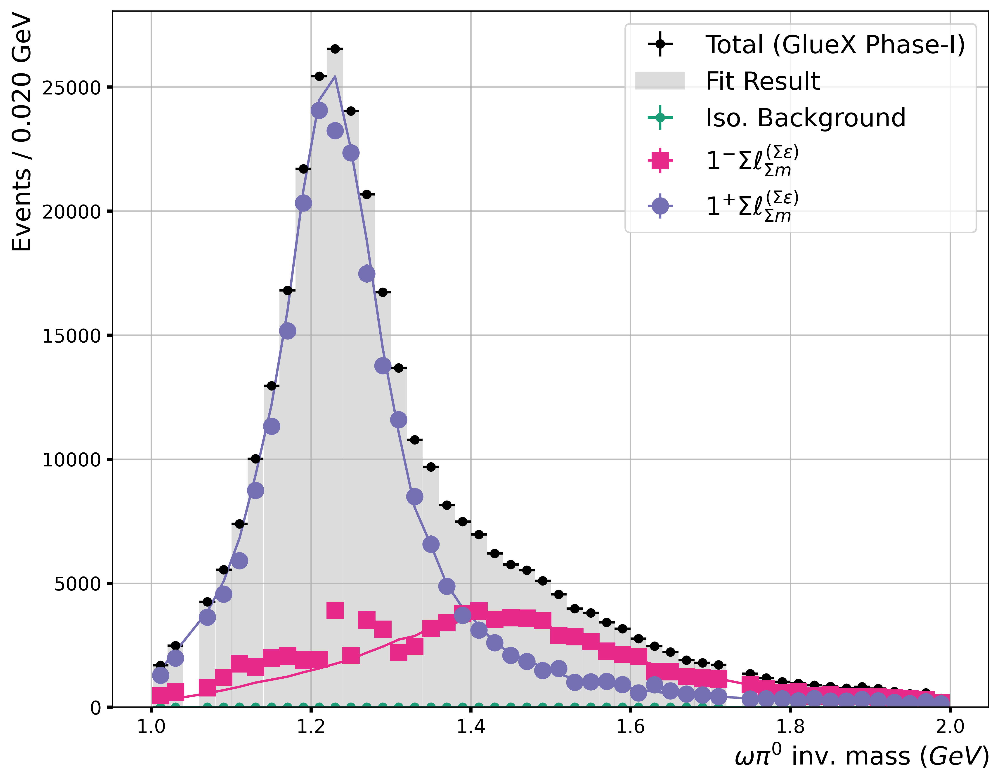

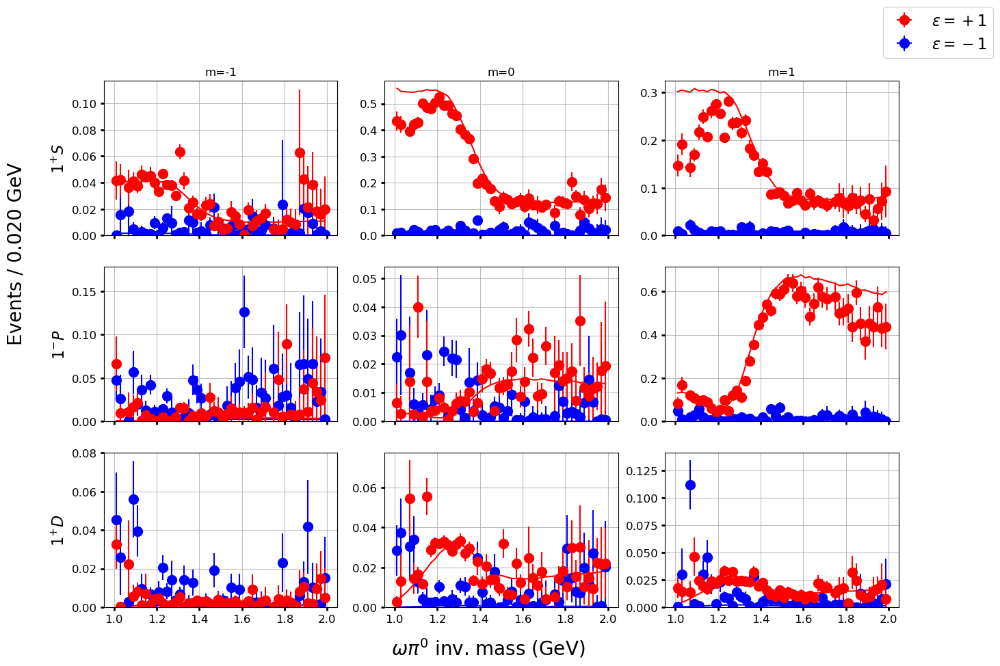

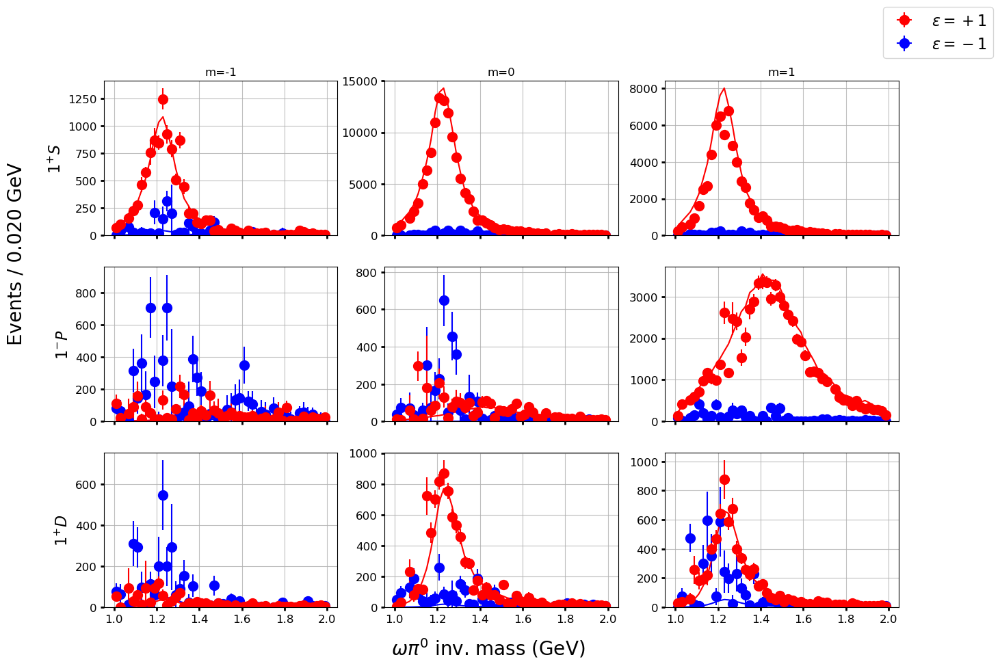

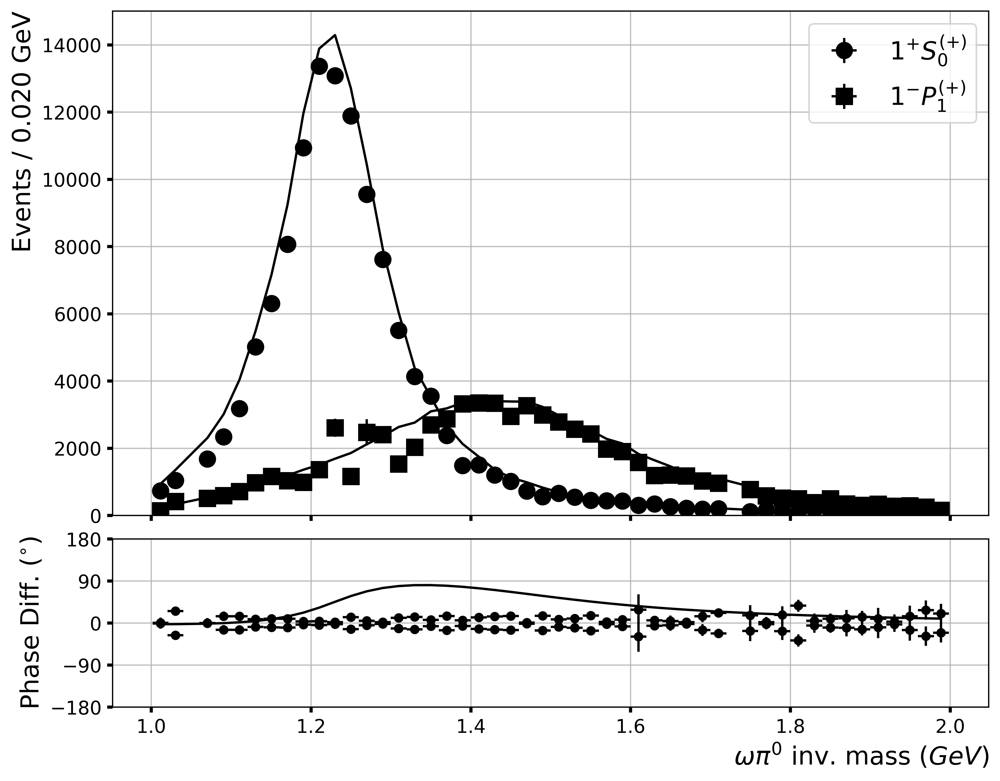

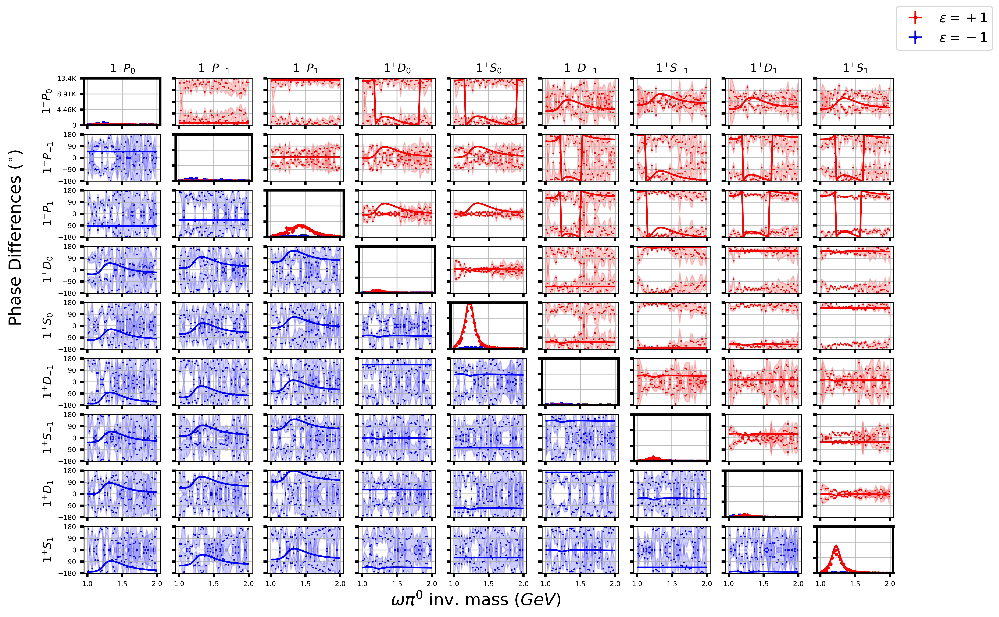

In [13]:
plotter.jp()
plotter.intensities(True, False)
plotter.intensities(False, False)
plotter.mass_phase("p1p0S", "p1mpP")
plotter.matrix()

The phase difference results will need to be corrected the same way the truth phases are, but even for now this doesn't look good. The total $J^P$ contribution is still having issues in the $b_1$ region, and worse yet we have two *new* bins that fail!

### Removing the $p\pi^0$ Mass Cut
Lets try completely removing that mass cut and see if the fit improves by gaining the information originally lost at $cos\theta > 0.8$

In [3]:
# load in the data, call them new dataframes to be safe

df_no_cut = pd.read_csv(f"{path}/pseudo-truth_ppi0-0.0.csv", index_col="index")
df_data_no_cut = pd.read_csv(f"{path}/data_no_cut.csv")
df_truth_no_cut = pd.read_csv(f"{path}/../truth.csv", index_col="index")

# bin 1.94-1.96 failed
df_data_no_cut.drop(47, inplace=True)
df_data_no_cut.reset_index(drop=True, inplace=True)
df_truth_no_cut.drop(47, inplace=True)
df_truth_no_cut.reset_index(drop=True, inplace=True)


# create the plotter object
plotter_no_cut = pwa_tools.Plotter(df_no_cut, df_data_no_cut, truth_df=df_truth_no_cut)

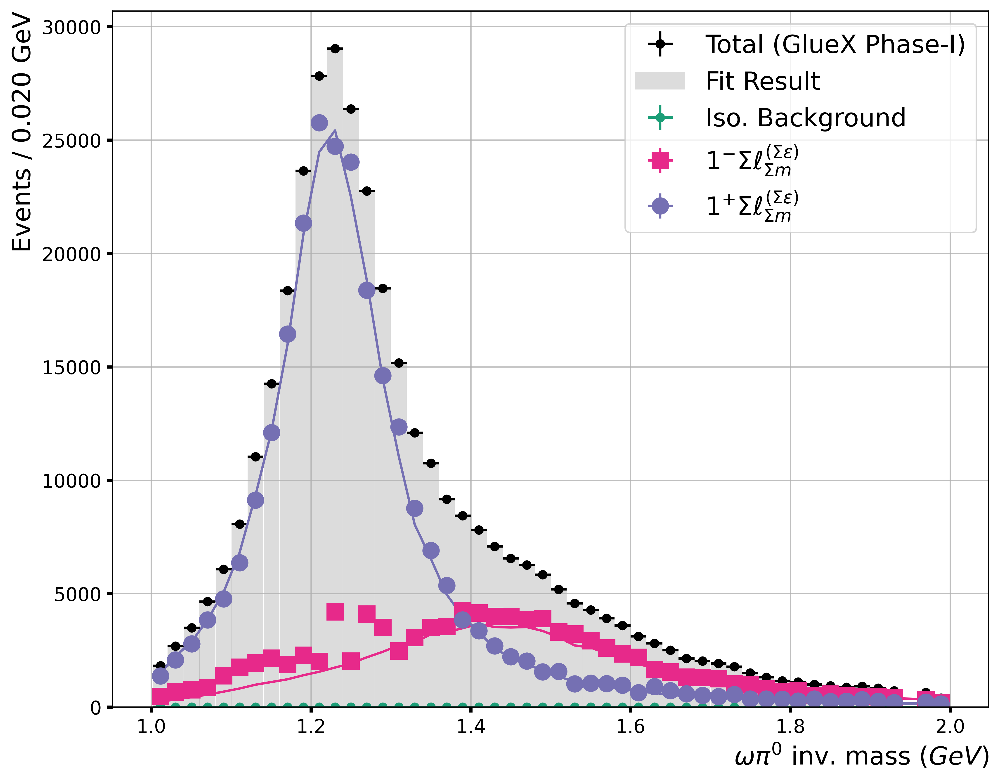

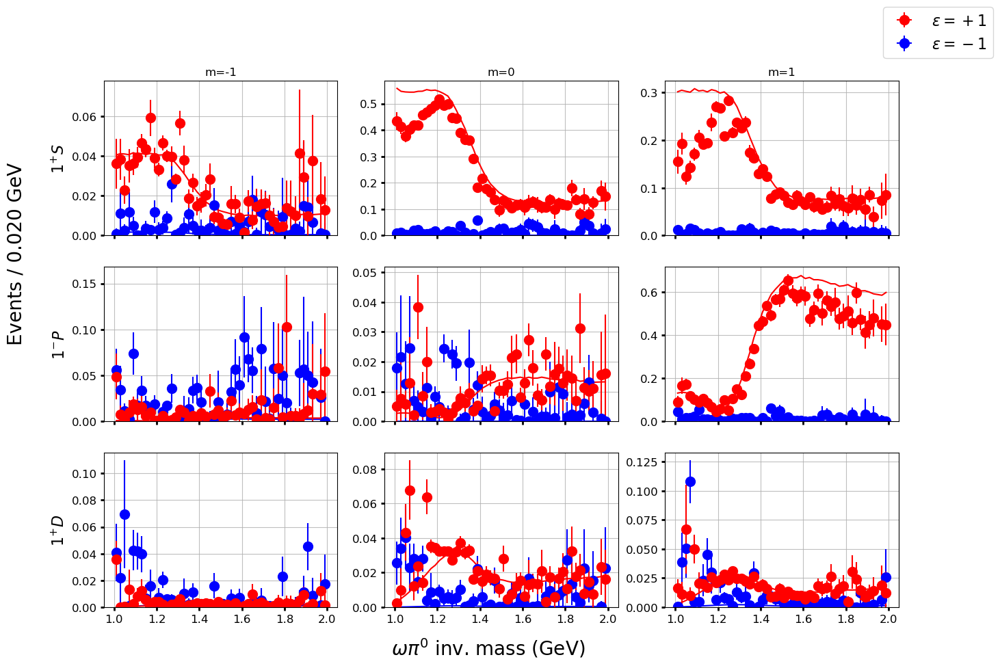

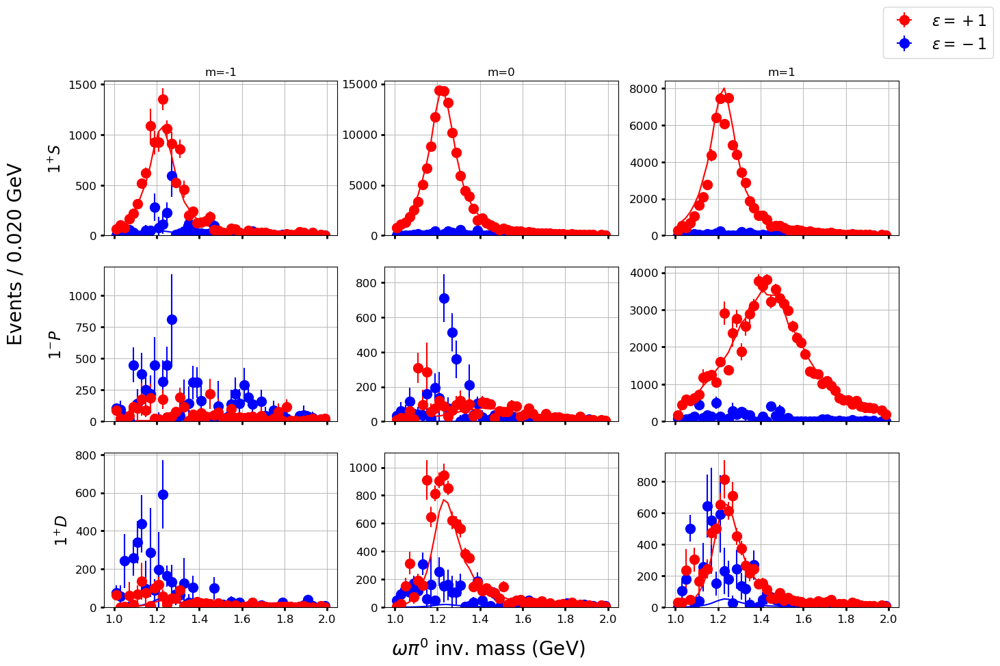

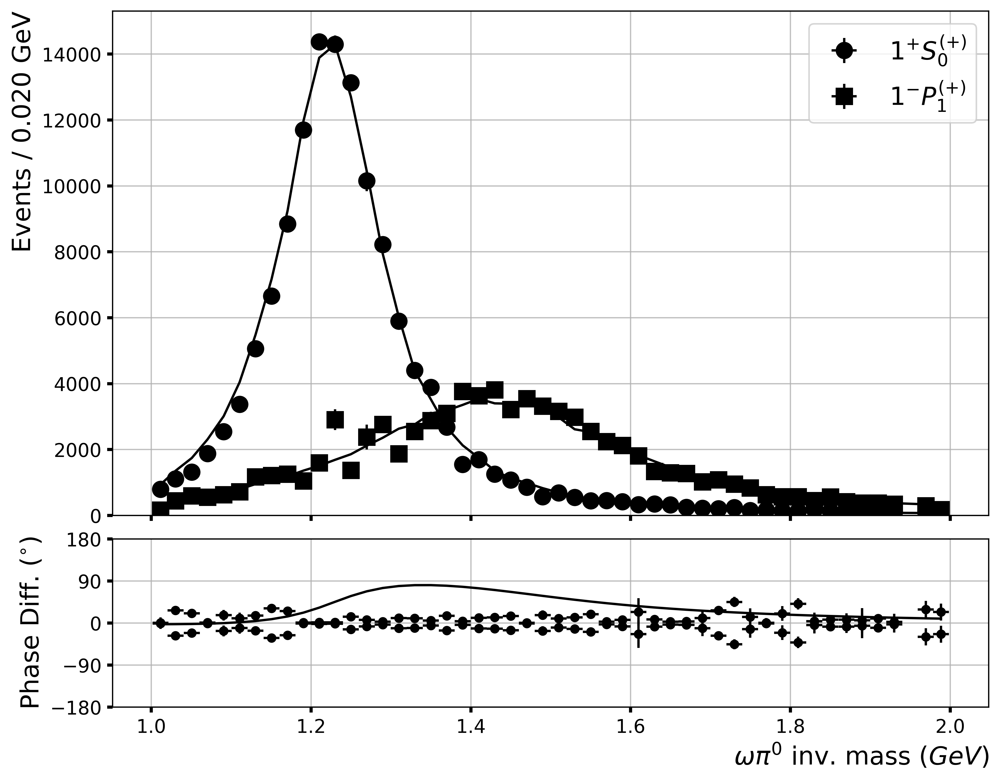

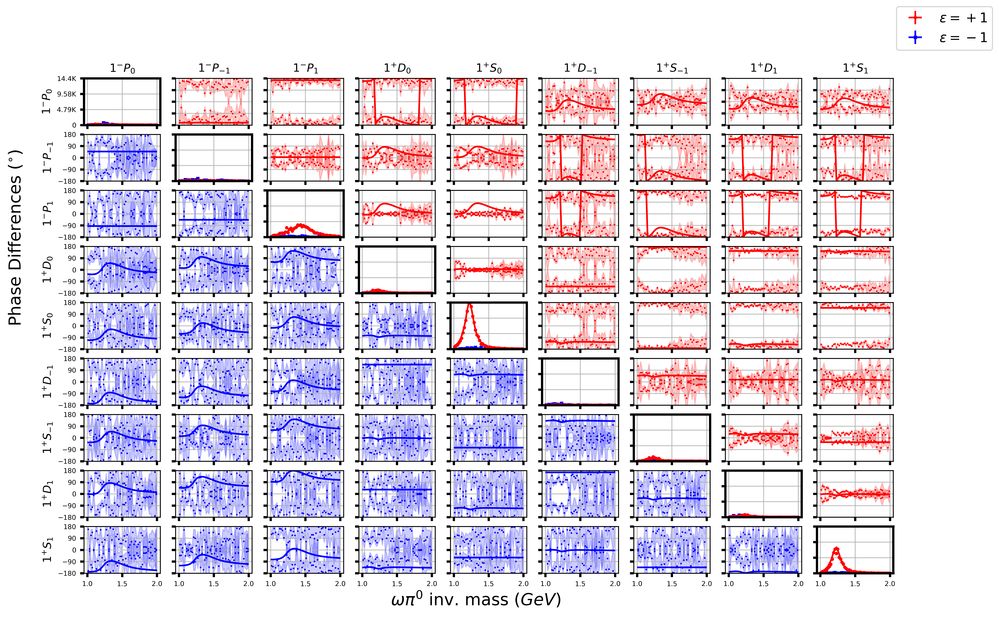

In [4]:
plotter_no_cut.jp()
plotter_no_cut.intensities(True, False)
plotter_no_cut.intensities(False, False)
plotter_no_cut.mass_phase("p1p0S", "p1mpP")
plotter_no_cut.matrix()

Nope, no improvement. Will just keep the mass cut then